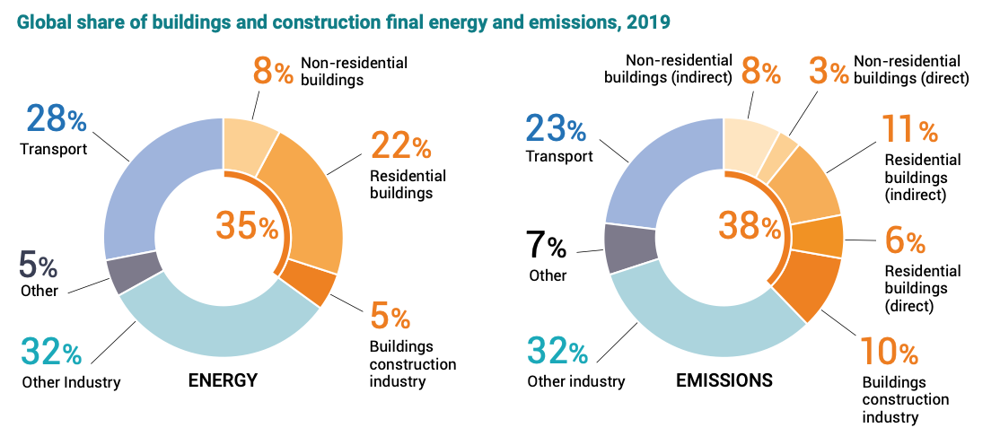

According to the '2020 GLOBAL STATUS REPORT FOR BUILDINGS AND CONSTRUCTION', in global share of buildings and construction final energy and emissions, 2019, residential buildings occupies 22% in energy consumption and 17% in emission. It has very huge impact to climate change. How we can manage and  control it well is very important. So I tried Energy Efficiency Model for Building.

reference: https://wedocs.unep.org/bitstream/handle/20.500.11822/34572/GSR_ES.pdf

I refered the notebook 'Modeling Energy Efficiency: Residential Building' (https://www.kaggle.com/code/winternguyen/modeling-energy-efficiency-residential-building/notebook) by Dr.Huynh Dong Nguyen.
In his notebook, especially, I have learned how I can tune the model well by GridSearchCV and I have also learned about MLPRegressor. Thank you very much for sharing !

# Importing

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/energy-efficiency-data-set/energy_efficiency_data.csv


In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [3]:
df=pd.read_csv('/kaggle/input/energy-efficiency-data-set/energy_efficiency_data.csv')

# Data Outline

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Relative_Compactness       768 non-null    float64
 1   Surface_Area               768 non-null    float64
 2   Wall_Area                  768 non-null    float64
 3   Roof_Area                  768 non-null    float64
 4   Overall_Height             768 non-null    float64
 5   Orientation                768 non-null    int64  
 6   Glazing_Area               768 non-null    float64
 7   Glazing_Area_Distribution  768 non-null    int64  
 8   Heating_Load               768 non-null    float64
 9   Cooling_Load               768 non-null    float64
dtypes: float64(8), int64(2)
memory usage: 60.1 KB


In [5]:
df.head()

,Relative_Compactness,Surface_Area,Wall_Area,Roof_Area,Overall_Height,Orientation,Glazing_Area,Glazing_Area_Distribution,Heating_Load,Cooling_Load
0,0.98,514.5,294.0,110.25,7.0,2,0.0,0,15.55,21.33
1,0.98,514.5,294.0,110.25,7.0,3,0.0,0,15.55,21.33
2,0.98,514.5,294.0,110.25,7.0,4,0.0,0,15.55,21.33
3,0.98,514.5,294.0,110.25,7.0,5,0.0,0,15.55,21.33
4,0.90,563.5,318.5,122.50,7.0,2,0.0,0,20.84,28.28


* Histogram of features

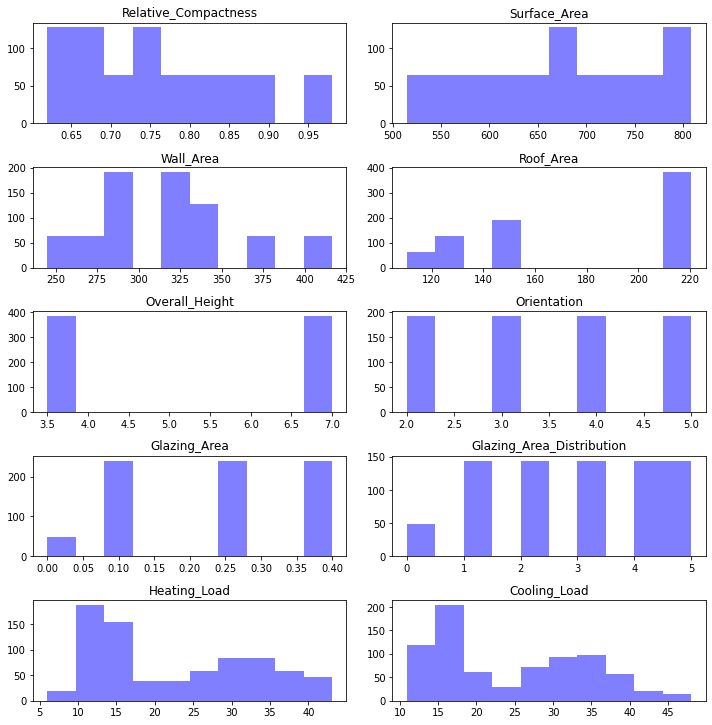

In [6]:
num_list = list(df.columns)

fig = plt.figure(figsize=(10,30))

for i in range(len(num_list)):
    plt.subplot(15,2,i+1)
    plt.title(num_list[i])
    plt.hist(df[num_list[i]],color='blue',alpha=0.5)

plt.tight_layout()

* Pairplot of features

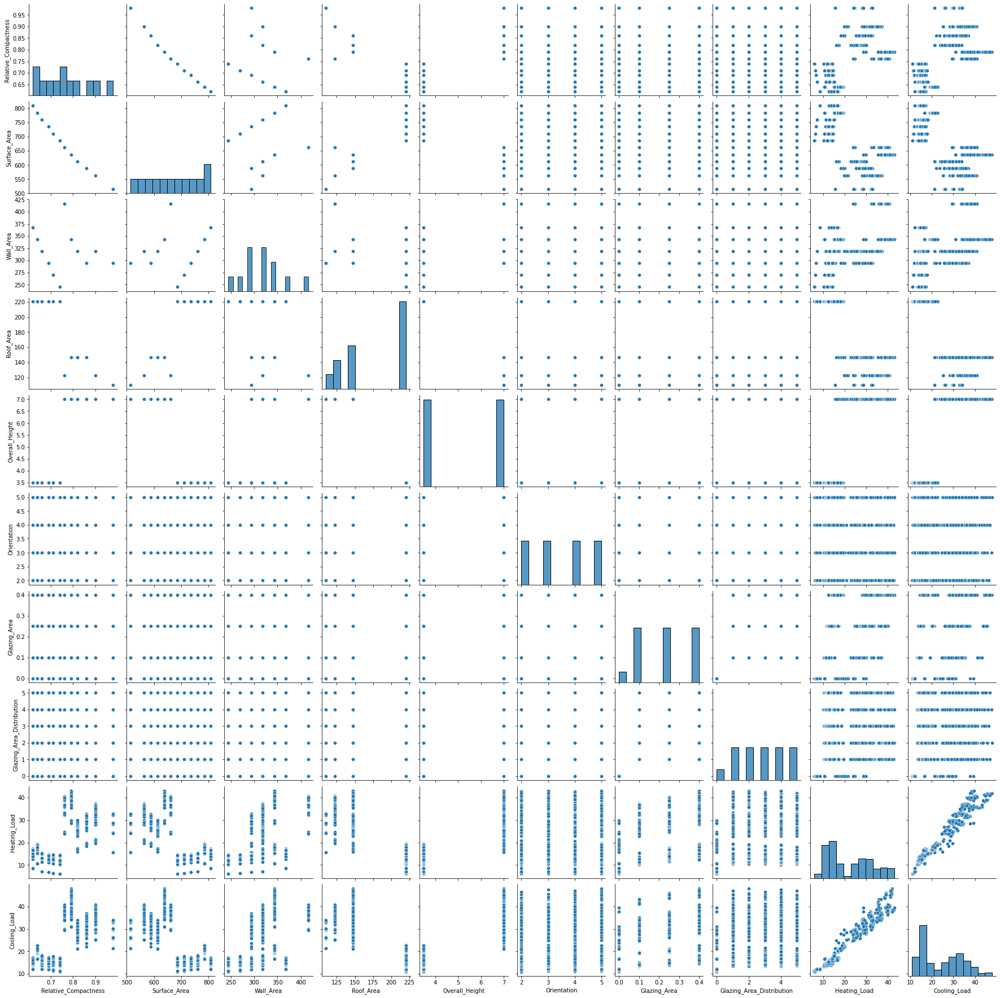

In [7]:
sns.pairplot(df)

* Correlation of features

<AxesSubplot:>

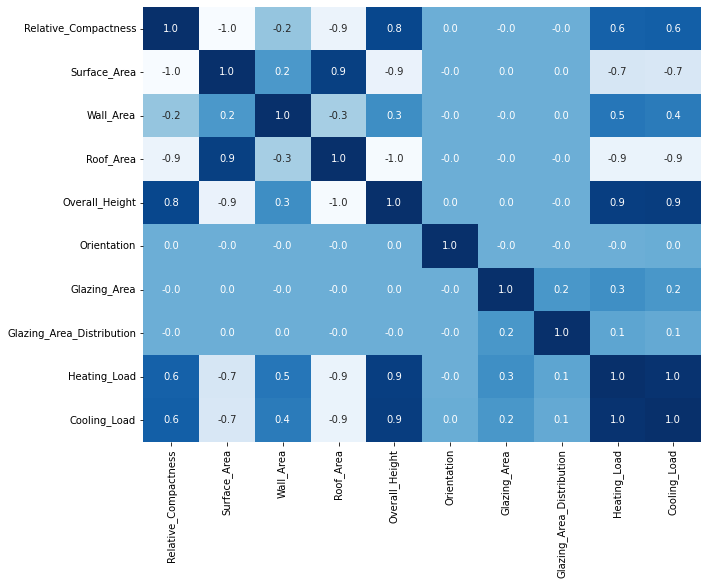

In [8]:
plt.figure(figsize = (10,8))
sns.heatmap(df.corr(),annot=True, cbar=False, cmap='Blues', fmt='.1f')

# Modeling

In [9]:
from scipy.stats import randint as sp_randint
from catboost import CatBoostRegressor
from sklearn.model_selection import GridSearchCV
from keras.layers import Dense
from keras.models import Sequential
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import GradientBoostingRegressor,AdaBoostRegressor,BaggingRegressor, RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.multioutput import MultiOutputRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.svm import SVC
from sklearn.svm import SVR
from sklearn.metrics import accuracy_score, f1_score
from sklearn.metrics import r2_score
from sklearn.metrics import roc_auc_score

This time, we have two targets, 'Heating_Load' and 'Cooling_Load'. So I set Y1 and Y2.

In [10]:
X=df.drop(['Heating_Load','Cooling_Load'],axis=1)
Y = df[['Heating_Load', 'Cooling_Load']]
Y1= df[['Heating_Load']]
Y2= df[['Cooling_Load']]

In [11]:
X_train, X_test, y1_train, y1_test, y2_train, y2_test = train_test_split(X, Y1, Y2, test_size=0.33, random_state = 20)

MinMax = MinMaxScaler(feature_range= (0,1))
X_train = MinMax.fit_transform(X_train)
X_test = MinMax.transform(X_test)

In [12]:
Acc = pd.DataFrame(index=None, columns=['model','train_Heating','test_Heating','train_Cooling','test_Cooling'])

In [13]:
regressors = [['SVR',SVR()],
              ['DecisionTreeRegressor',DecisionTreeRegressor()],
              ['KNeighborsRegressor', KNeighborsRegressor()],
              ['RandomForestRegressor', RandomForestRegressor()],
              ['MLPRegressor',MLPRegressor()],
              ['AdaBoostRegressor',AdaBoostRegressor()],
              ['GradientBoostingRegressor',GradientBoostingRegressor()]]

In [14]:
for mod in regressors:
    name = mod[0]
    model = mod[1]
    
    model.fit(X_train,y1_train)
    actr1 = r2_score(y1_train, model.predict(X_train))
    acte1 = r2_score(y1_test, model.predict(X_test))
    
    model.fit(X_train,y2_train)
    actr2 = r2_score(y2_train, model.predict(X_train))
    acte2 = r2_score(y2_test, model.predict(X_test))
    
    Acc = Acc.append(pd.Series({'model':name, 'train_Heating':actr1,'test_Heating':acte1,'train_Cooling':actr2,'test_Cooling':acte2}),ignore_index=True )
Acc.sort_values(by='test_Cooling')

,model,train_Heating,test_Heating,train_Cooling,test_Cooling
4,MLPRegressor,0.867137,0.875522,0.808097,0.833638
0,SVR,0.930860,0.910524,0.892760,0.887407
2,KNeighborsRegressor,0.945711,0.904910,0.926867,0.889114
5,AdaBoostRegressor,0.972351,0.969049,0.933682,0.935901
1,DecisionTreeRegressor,1.000000,0.997201,1.000000,0.949637
3,RandomForestRegressor,0.999574,0.997692,0.995416,0.965612
6,GradientBoostingRegressor,0.998144,0.997599,0.979338,0.975855


In testing, GBR has the best both in Y1 and Y2.

# Tuning

* Decision Tree Regressor parameters turning

In [15]:
DTR = DecisionTreeRegressor()
param_grid = {"criterion": ["mse", "mae"],"min_samples_split": [14, 15, 16, 17],
              "max_depth": [5, 6, 7],"min_samples_leaf": [4, 5, 6],"max_leaf_nodes": [29, 30, 31, 32],}

grid_cv_DTR = GridSearchCV(DTR, param_grid, cv=5)

grid_cv_DTR.fit(X_train,y2_train)
print("R-Squared::{}".format(grid_cv_DTR.best_score_))
print("Best Hyperparameters::\n{}".format(grid_cv_DTR.best_params_))

R-Squared::0.9599150110108299
Best Hyperparameters::
{'criterion': 'mse', 'max_depth': 6, 'max_leaf_nodes': 32, 'min_samples_leaf': 5, 'min_samples_split': 17}


In [16]:
DTR = DecisionTreeRegressor(criterion= 'mse', max_depth= 6, max_leaf_nodes= 32, min_samples_leaf= 5, min_samples_split= 17)

DTR.fit(X_train,y1_train)
print("R-Squared on Y1test dataset={}".format(DTR.score(X_test,y1_test)))

DTR.fit(X_train,y2_train)   
print("R-Squared on Y2test dataset={}".format(DTR.score(X_test,y2_test)))

R-Squared on Y1test dataset=0.9953559923756888
R-Squared on Y2test dataset=0.9592409931240967


It has improve only in Y2.

* Random Forests parameters tuning

In [17]:
from sklearn.model_selection import GridSearchCV
param_grid = [{'n_estimators': [350, 400, 450], 'max_features': [1, 2], 'max_depth': [85, 90, 95]}]

RFR = RandomForestRegressor(n_jobs=-1)
grid_search_RFR = GridSearchCV(RFR, param_grid, cv=10, scoring='neg_mean_squared_error')
grid_search_RFR.fit(X_train, y2_train)

print("R-Squared::{}".format(grid_search_RFR.best_score_))
print("Best Hyperparameters::\n{}".format(grid_search_RFR.best_params_))

R-Squared::-2.6537073026922715
Best Hyperparameters::
{'max_depth': 85, 'max_features': 1, 'n_estimators': 400}


In [18]:
RFR = RandomForestRegressor(n_estimators = 400, max_features = 1, max_depth= 90, bootstrap= True)

RFR.fit(X_train,y1_train)
print("R-Squared on Y1test dataset={}".format(RFR.score(X_test,y1_test)))

RFR.fit(X_train,y2_train)   
print("R-Squaredon Y2test dataset={}".format(RFR.score(X_test,y2_test)))

R-Squared on Y1test dataset=0.9924342516452103
R-Squaredon Y2test dataset=0.9747786552470636


It has improve only in Y2.

* Gradient Boosting Regression - Hyperparameter Tuning

In [19]:
param_grid = [{"learning_rate": [0.01, 0.02, 0.1], "n_estimators":[150, 200, 250], "max_depth": [4, 5, 6], 
 "min_samples_split":[1, 2, 3], "min_samples_leaf":[2, 3], "subsample":[1.0, 2.0]}]

GBR = GradientBoostingRegressor()
grid_search_GBR = GridSearchCV(GBR, param_grid, cv=10, scoring='neg_mean_squared_error')
grid_search_GBR.fit(X_train, y2_train)

print("R-Squared::{}".format(grid_search_GBR.best_score_))
print("Best Hyperparameters::\n{}".format(grid_search_GBR.best_params_))

R-Squared::-1.0446983020559693
Best Hyperparameters::
{'learning_rate': 0.1, 'max_depth': 5, 'min_samples_leaf': 3, 'min_samples_split': 3, 'n_estimators': 250, 'subsample': 1.0}


In [20]:
GBR = GradientBoostingRegressor(learning_rate=0.1,n_estimators=250, max_depth=5, min_samples_split=3, min_samples_leaf=2, subsample=1.0)

GBR.fit(X_train,y1_train)
print("R-Squared on Y1test dataset={}".format(GBR.score(X_test,y1_test)))

GBR.fit(X_train,y2_train)   
print("R-Squaredon Y2test dataset={}".format(GBR.score(X_test,y2_test)))

R-Squared on Y1test dataset=0.9988898307875669
R-Squaredon Y2test dataset=0.9928177033043692


It has improved both in Y1 and Y2.

* CatBoostRegressor

In [21]:
from catboost import CatBoostRegressor
model_CBR = CatBoostRegressor()
parameters = {'depth':[8, 10],'iterations':[10000],'learning_rate':[0.02,0.03],
              'border_count':[5],'random_state': [42, 45]}

grid = GridSearchCV(estimator=model_CBR, param_grid = parameters, cv = 2, n_jobs=-1)
grid.fit(X_train, y2_train)
print(" Results from Grid Search " )
print("\n The best estimator across ALL searched params:\n", grid.best_estimator_)
print("\n The best score across ALL searched params:\n", grid.best_score_)
print("\n The best parameters across ALL searched params:\n", grid.best_params_)

0:	learn: 8.9522678	total: 54.8ms	remaining: 9m 8s
1:	learn: 8.8187364	total: 55.4ms	remaining: 4m 37s
2:	learn: 8.6826608	total: 55.7ms	remaining: 3m 5s
3:	learn: 8.5562103	total: 56ms	remaining: 2m 20s
4:	learn: 8.4196473	total: 56.5ms	remaining: 1m 52s
5:	learn: 8.3059370	total: 57.1ms	remaining: 1m 35s
6:	learn: 8.1769577	total: 57.3ms	remaining: 1m 21s
7:	learn: 8.0520266	total: 57.5ms	remaining: 1m 11s
8:	learn: 7.9449094	total: 59.3ms	remaining: 1m 5s
9:	learn: 7.8395328	total: 59.9ms	remaining: 59.8s
10:	learn: 7.7228068	total: 60ms	remaining: 54.5s
11:	learn: 7.5965967	total: 60.2ms	remaining: 50.1s
12:	learn: 7.4731104	total: 60.3ms	remaining: 46.4s
13:	learn: 7.3704019	total: 60.6ms	remaining: 43.2s
14:	learn: 7.2637632	total: 60.7ms	remaining: 40.4s
15:	learn: 7.1579667	total: 60.9ms	remaining: 38s
16:	learn: 7.0574362	total: 63.5ms	remaining: 37.3s
17:	learn: 6.9458502	total: 63.6ms	remaining: 35.3s
18:	learn: 6.8464598	total: 63.8ms	remaining: 33.5s
19:	learn: 6.7536915	t

* Tuning CatBoostRegressor

In [22]:
model = CatBoostRegressor(border_count= 5, depth= 10, iterations= 10000, learning_rate= 0.02, random_state= 42)

model.fit(X_train,y1_train)
actr1 = r2_score(y1_train, model.predict(X_train))
acte1 = r2_score(y1_test, model.predict(X_test))
y1_pred = model.predict(X_test)

model.fit(X_train,y2_train)
actr2 = r2_score(y2_train, model.predict(X_train))
acte2 = r2_score(y2_test, model.predict(X_test))
y2_pred = model.predict(X_test)

0:	learn: 9.8695974	total: 528us	remaining: 5.28s
1:	learn: 9.7093886	total: 1.17ms	remaining: 5.83s
2:	learn: 9.5559290	total: 1.59ms	remaining: 5.31s
3:	learn: 9.3925926	total: 2.09ms	remaining: 5.22s
4:	learn: 9.2369666	total: 2.61ms	remaining: 5.21s
5:	learn: 9.1037368	total: 3.48ms	remaining: 5.8s
6:	learn: 8.9511853	total: 4ms	remaining: 5.71s
7:	learn: 8.7922719	total: 4.31ms	remaining: 5.38s
8:	learn: 8.6431071	total: 4.66ms	remaining: 5.17s
9:	learn: 8.5021644	total: 5.01ms	remaining: 5s
10:	learn: 8.3771983	total: 5.47ms	remaining: 4.97s
11:	learn: 8.2416531	total: 5.81ms	remaining: 4.84s
12:	learn: 8.0981213	total: 6.21ms	remaining: 4.77s
13:	learn: 7.9742595	total: 6.82ms	remaining: 4.86s
14:	learn: 7.8537997	total: 7.44ms	remaining: 4.96s
15:	learn: 7.7254981	total: 7.77ms	remaining: 4.85s
16:	learn: 7.6063617	total: 8.18ms	remaining: 4.8s
17:	learn: 7.4847153	total: 8.62ms	remaining: 4.78s
18:	learn: 7.3663397	total: 8.92ms	remaining: 4.69s
19:	learn: 7.2493309	total: 9.3

In [23]:
print("CatBoostRegressor: R-Squared on train dataset={}".format(actr1))
print("CatBoostRegressor: R-Squared on Y1test dataset={}".format(acte1))
print("CatBoostRegressor: R-Squared on train dataset={}".format(actr2))
print("CatBoostRegressor: R-Squared on Y2test dataset={}".format(acte2))

CatBoostRegressor: R-Squared on train dataset=0.9999999999791284
CatBoostRegressor: R-Squared on Y1test dataset=0.9985652715060828
CatBoostRegressor: R-Squared on train dataset=0.9999999999393913
CatBoostRegressor: R-Squared on Y2test dataset=0.9927296805043709


* MLPRegressor

In [24]:
MLPR = MLPRegressor(hidden_layer_sizes = [180,100,20],activation ='relu', solver='lbfgs',max_iter = 10000,random_state = 0)
MLPR.fit(X_train,y1_train)
print("R-Squared on Y1test dataset={}".format(MLPR.score(X_test,y1_test)))

MLPR.fit(X_train,y2_train)   
print("R-Squaredon Y2test dataset={}".format(MLPR.score(X_test,y2_test)))

R-Squared on Y1test dataset=0.9949999558063456
9854:	learn: 0.0515008	total: 30.9s	remaining: 455ms
9855:	learn: 0.0515008	total: 30.9s	remaining: 451ms
9856:	learn: 0.0515008	total: 30.9s	remaining: 448ms
9857:	learn: 0.0515008	total: 30.9s	remaining: 445ms
9858:	learn: 0.0515008	total: 30.9s	remaining: 442ms
9859:	learn: 0.0515008	total: 30.9s	remaining: 439ms
9860:	learn: 0.0515008	total: 30.9s	remaining: 436ms
9861:	learn: 0.0515008	total: 30.9s	remaining: 432ms
9862:	learn: 0.0515008	total: 30.9s	remaining: 429ms
9863:	learn: 0.0515008	total: 30.9s	remaining: 426ms
9864:	learn: 0.0515008	total: 30.9s	remaining: 423ms
9865:	learn: 0.0515008	total: 30.9s	remaining: 420ms
9866:	learn: 0.0515008	total: 30.9s	remaining: 417ms
9867:	learn: 0.0515008	total: 30.9s	remaining: 414ms
9868:	learn: 0.0515008	total: 30.9s	remaining: 410ms
9869:	learn: 0.0515008	total: 30.9s	remaining: 407ms
9870:	learn: 0.0515008	total: 30.9s	remaining: 404ms
9871:	learn: 0.0515008	total: 30.9s	remaining: 401ms

# Find the best model

In [25]:
Acc1 = pd.DataFrame(index=None, columns=['model','train_Heating','test_Heating','train_Cooling','test_Cooling'])

In [26]:
regressors1 = [['DecisionTreeRegressor',DecisionTreeRegressor(criterion= 'mse', max_depth= 6, max_leaf_nodes= 30, min_samples_leaf= 5, min_samples_split= 17)],
              ['RandomForestRegressor', RandomForestRegressor(n_estimators = 450, max_features = 1, max_depth= 90, bootstrap= True)],
              ['MLPRegressor',MLPRegressor(hidden_layer_sizes = [180,100,20],activation ='relu', solver='lbfgs',max_iter = 10000,random_state = 0)],
              ['GradientBoostingRegressor',GradientBoostingRegressor(learning_rate=0.1,n_estimators=250, max_depth=5, min_samples_split=2, min_samples_leaf=3, subsample=1.0)]]

In [27]:
for mod in regressors1:
    name = mod[0]
    model = mod[1]
    
    model.fit(X_train,y1_train)
    actr1 = r2_score(y1_train, model.predict(X_train))
    acte1 = r2_score(y1_test, model.predict(X_test))
    
    model.fit(X_train,y2_train)
    actr2 = r2_score(y2_train, model.predict(X_train))
    acte2 = r2_score(y2_test, model.predict(X_test))
    
    Acc1 = Acc1.append(pd.Series({'model':name, 'train_Heating':actr1,'test_Heating':acte1,'train_Cooling':actr2,'test_Cooling':acte2}),ignore_index=True )
Acc1.sort_values(by='test_Cooling')

,model,train_Heating,test_Heating,train_Cooling,test_Cooling
0,DecisionTreeRegressor,0.994803,0.995168,0.967655,0.959112
1,RandomForestRegressor,0.998787,0.992234,0.996301,0.974277
2,MLPRegressor,0.999877,0.995000,0.999602,0.988670
3,GradientBoostingRegressor,0.999745,0.998327,0.999009,0.990750


In [28]:
print("CatBoostRegressor: R-Squared on train dataset={}".format(actr1))
print("CatBoostRegressor: R-Squared on Y1test dataset={}".format(acte1))
print("CatBoostRegressor: R-Squared on train dataset={}".format(actr2))
print("CatBoostRegressor: R-Squared on Y2test dataset={}".format(acte2))

CatBoostRegressor: R-Squared on train dataset=0.9997451597863531
CatBoostRegressor: R-Squared on Y1test dataset=0.9983265070363931
CatBoostRegressor: R-Squared on train dataset=0.999009441044671
CatBoostRegressor: R-Squared on Y2test dataset=0.9907499623482481


CatBoostRegressor is the best in 6 models.

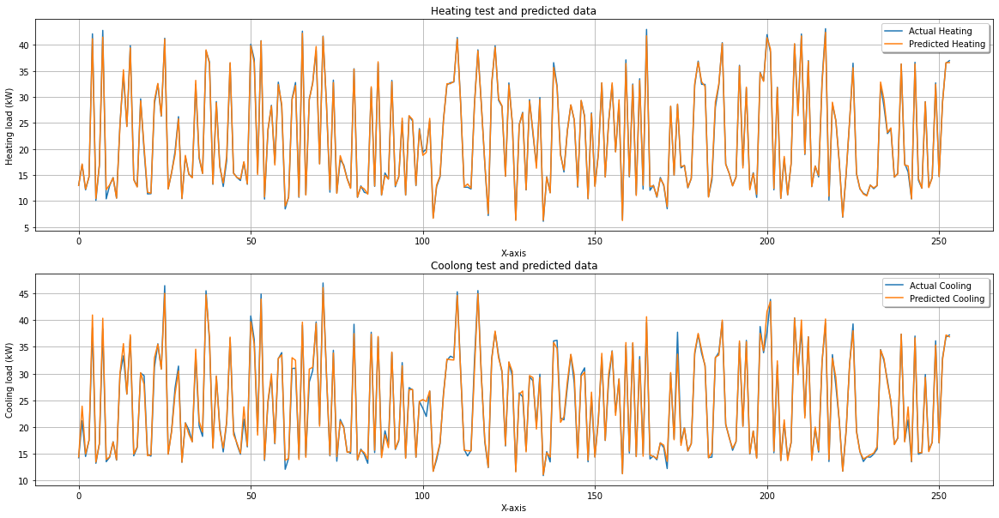

In [29]:
x_ax = range(len(y1_test))
plt.figure(figsize=(20,10))
plt.subplot(2,1,1)
plt.plot(x_ax, y1_test, label="Actual Heating")
plt.plot(x_ax, y1_pred, label="Predicted Heating")
plt.title("Heating test and predicted data")
plt.xlabel('X-axis')
plt.ylabel('Heating load (kW)')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)

plt.subplot(2,1,2)
plt.plot(x_ax, y2_test, label="Actual Cooling")
plt.plot(x_ax, y2_pred, label="Predicted Cooling")
plt.title("Coolong test and predicted data")
plt.xlabel('X-axis')
plt.ylabel('Cooling load (kW)')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)

plt.show()

reference :  'Modeling Energy Efficiency: Residential Building' (https://www.kaggle.com/code/winternguyen/modeling-energy-efficiency-residential-building/notebook) by Dr.Huynh Dong Nguyen.

Thank you !